# Project Earthquakes Kenny TANCHALEUNE

The objective of this dataset is to locate and analyze the number of earthquakes according to the years. (1965-2016)

# Library

In [1]:
import pandas as pd
import numpy as np
import reverse_geocode
from pycountry_convert import country_alpha2_to_continent_code as pycountry_convert
import pycountry
import pycountry_convert as pc
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

%matplotlib inline

# Data cleaning and Preprocessing

In [2]:
data = pd.read_csv("earthquake.csv",encoding="utf8")
data.head()


,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [3]:
print(data.shape)

(23412, 21)


Dataset before cleaning: 23412 rows, 21 columns

In [4]:
data['Date'] = pd.to_datetime(data['Date'], format= "%m/%d/%Y", errors= "coerce")
data[data.Date.isnull()]

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
3378,NaT,1975-02-23T02:58:41.000Z,8.017,124.075,Earthquake,623.0,NaN,NaN,5.6,MB,...,NaN,NaN,NaN,NaN,NaN,USP0000A09,US,US,US,Reviewed
7512,NaT,1985-04-28T02:53:41.530Z,-32.998,-71.766,Earthquake,33.0,NaN,NaN,5.6,MW,...,NaN,NaN,NaN,NaN,1.30,USP0002E81,US,US,HRV,Reviewed
20650,NaT,2011-03-13T02:23:34.520Z,36.344,142.344,Earthquake,10.1,13.9,289.0,5.8,MWC,...,NaN,32.3,NaN,NaN,1.06,USP000HWQP,US,US,GCMT,Reviewed


We check if the whole Date column is in the same format. We can see that we have 3 problem lines.



In [5]:
data = data.drop([3378, 7512, 20650])

So we delete it

In [6]:
new_data = data.copy()

Now we copy the dataset into a new variable in order to work with.



In [7]:
new_data.drop(['Depth Error','Depth Seismic Stations','Status', 'Magnitude Error','Magnitude Seismic Stations','Azimuthal Gap','Horizontal Distance','Horizontal Error', 'Root Mean Square','ID', 'Location Source','Magnitude Source'], axis = 1, inplace = True)

We remove the columns which are not useful for our analysis.



In [8]:
new_data['Year'] = pd.to_datetime(new_data['Date']).dt.to_period('Y')
new_data['Year'] = new_data['Year'].astype(str)
new_data['Year'] = new_data['Year'].astype("int64")

We create a Year column from the Date column.



In [9]:
new_data = new_data.set_index('Date', drop = True)

The Date column will be the index of our dataset.



In [10]:
coords = tuple(zip(new_data['Latitude'], new_data['Longitude']))
results = reverse_geocode.search(coords)
results_admin2 = [x.get('country') for x in results]
new_data['Coutries'] = results_admin2

In our dataset, on one of the coordinates. from these coordinates, on will find the names of the countries that correspond using the reverse geocode. We will put the names of the countries in a new column.

In [11]:
new_data.head()

,Time,Latitude,Longitude,Type,Depth,Magnitude,Magnitude Type,Source,Year,Coutries
Date,,,,,,,,,,
1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,MW,ISCGEM,1965,Northern Mariana Islands
1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,MW,ISCGEM,1965,Indonesia
1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,MW,ISCGEM,1965,Tonga
1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,MW,ISCGEM,1965,South Georgia and the South Sandwich Islands
1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,MW,ISCGEM,1965,Philippines


In [12]:
countries = {}
input_countries = new_data['Coutries'].tolist()
for country in pycountry.countries:
    countries[country.name] = country.alpha_2

codes = [countries.get(country,np.nan) for country in input_countries]

new_data["Pays_code"] = codes

From the country names, we will find their Alpha2 code which will be useful later in our analysis.



In [13]:
new_data.head()

,Time,Latitude,Longitude,Type,Depth,Magnitude,Magnitude Type,Source,Year,Coutries,Pays_code
Date,,,,,,,,,,,
1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,MW,ISCGEM,1965,Northern Mariana Islands,MP
1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,MW,ISCGEM,1965,Indonesia,ID
1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,MW,ISCGEM,1965,Tonga,TO
1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,MW,ISCGEM,1965,South Georgia and the South Sandwich Islands,GS
1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,MW,ISCGEM,1965,Philippines,PH


In [14]:
new_data = new_data.dropna()

We delete all lines that have null values.



In [15]:
bh = new_data['Coutries'].tolist()
stocks=[]
for i in new_data['Coutries']:
    
    stock = pc.country_name_to_country_alpha3(i, cn_name_format="default")
    stocks.append(stock)
stocks = pd.DataFrame(stocks)
stocks.rename(columns={0:'Pays_code3'}, inplace = True)
stocks = np.array(stocks)
new_data['Pays_code3'] = stocks

Here from the names of the countries, we will also create a column which contains the alpha3 code of the countries. We use the alpha3 code for plotly. It doesn't work with alpha2 code, it only detects the code.

In [16]:
continent = new_data['Pays_code'].tolist()
pays_l = []
for count in continent:
    try:
        a =pc.country_alpha2_to_continent_code(count)
        
        pays_l.append(a)
    except KeyError:
        pays_l.append(np.nan)

new_data['Continents'] =pays_l

From the alpha2 code of the countries, we will find the names code of the continents that correspond. Then we will put the continents in a new column.



In [17]:
new_data.head()

,Time,Latitude,Longitude,Type,Depth,Magnitude,Magnitude Type,Source,Year,Coutries,Pays_code,Pays_code3,Continents
Date,,,,,,,,,,,,,
1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,MW,ISCGEM,1965,Northern Mariana Islands,MP,MNP,OC
1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,MW,ISCGEM,1965,Indonesia,ID,IDN,AS
1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,MW,ISCGEM,1965,Tonga,TO,TON,OC
1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,MW,ISCGEM,1965,South Georgia and the South Sandwich Islands,GS,SGS,SA
1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,MW,ISCGEM,1965,Philippines,PH,PHL,AS


In [18]:
new_data = new_data.dropna()

We delete once again the lines which have null values.

In [19]:
new_data['Continents'].unique().tolist()

['OC', 'AS', 'SA', 'EU', 'NA', 'AF']

We display in a list the continent codes.



In [20]:
new_data['Continents'].replace('OC','Oceania',inplace = True)
new_data['Continents'].replace('AS','Asia',inplace = True)
new_data['Continents'].replace('SA','South America',inplace = True)
new_data['Continents'].replace('EU','Europe',inplace = True)
new_data['Continents'].replace('NA','North America',inplace = True)
new_data['Continents'].replace('AF','Africa',inplace = True)

We replace with the full name of the continents for better visibility.



In [21]:
new_data.head()

,Time,Latitude,Longitude,Type,Depth,Magnitude,Magnitude Type,Source,Year,Coutries,Pays_code,Pays_code3,Continents
Date,,,,,,,,,,,,,
1965-01-02,13:44:18,19.246,145.616,Earthquake,131.6,6.0,MW,ISCGEM,1965,Northern Mariana Islands,MP,MNP,Oceania
1965-01-04,11:29:49,1.863,127.352,Earthquake,80.0,5.8,MW,ISCGEM,1965,Indonesia,ID,IDN,Asia
1965-01-05,18:05:58,-20.579,-173.972,Earthquake,20.0,6.2,MW,ISCGEM,1965,Tonga,TO,TON,Oceania
1965-01-08,18:49:43,-59.076,-23.557,Earthquake,15.0,5.8,MW,ISCGEM,1965,South Georgia and the South Sandwich Islands,GS,SGS,South America
1965-01-09,13:32:50,11.938,126.427,Earthquake,15.0,5.8,MW,ISCGEM,1965,Philippines,PH,PHL,Asia


In [22]:
print(new_data.isna().sum())


Time              0
Latitude          0
Longitude         0
Type              0
Depth             0
Magnitude         0
Magnitude Type    0
Source            0
Year              0
Coutries          0
Pays_code         0
Pays_code3        0
Continents        0
dtype: int64


There is no null value

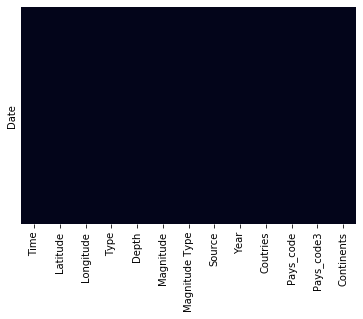

In [23]:
sns.heatmap(new_data.isnull(), yticklabels=False,cbar = False)

We can see graphically that there is no null value.



In [24]:
print(new_data.shape)

(22446, 13)


Before data cleaning: 23412 rows, 21 columns ------ After data cleaning: 22446 rows, 13 columns

# Data analysis with Visualisations

In [25]:
from bokeh.io import show, output_file
from bokeh.models import ColumnDataSource
from bokeh.palettes import Spectral4
from bokeh.plotting import figure
from bokeh.io import show, output_notebook
from bokeh.transform import factor_cmap

output_notebook()

earthquake = new_data['Type'] == 'Earthquake'
types = ['Earthquake', 'Nuclear Explosion', 'Explosion', 'Rock Burst']
#counts = new_data.Continents.groupby(new_data.Continents).count()

#counts = new_data['Continents'].groupby(earthquake).count()
#counts = earthquake.groupby(new_data['Continents']).count()
counts = new_data['Type'].groupby(new_data['Type']).count()

source = ColumnDataSource(data=dict(types=types, counts=counts, color=Spectral4))

p = figure(x_range=types, plot_height=250, title="Differents type of Earthquakes",
           toolbar_location=None, tools="")

p.vbar(x='types', top='counts', width=0.9,legend="types", color='color', source=source)


p.legend.orientation = "horizontal"
p.legend.location = "top_center"

show(p)

Loading BokehJS ...

We can see different types. Our dataset is mainly composed of the earthquake type. Nuclear Explosion, Explosion, Rock Burst nuclear are in the minority.



In [26]:
import plotly.graph_objects as go

earthquake = new_data['Type'] == 'Earthquake'
labels = ['Africa', 'Asia', 'Europe', 'North America', 'Oceania', 'South America']
values = earthquake.groupby(new_data['Continents']).sum()

fig = go.Figure(data=[go.Pie(labels=labels, values= values, title="Distribution of earthquakes according to the continents")])
fig.show()

In this pie chart, we can see that the continents most affected by earthquakes are Asia and Oceania with a percentage of around 33%.
Africa is the least affected continent with a percentage of 1.67%.

# 10 countries that are most affected by earthquakes

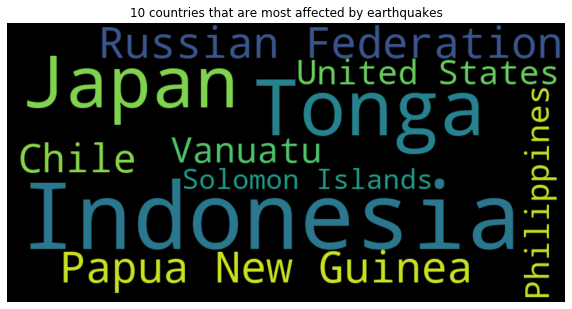

In [27]:
az = new_data.Coutries.value_counts()
az = pd.DataFrame(az)
az = az.reset_index()
data = dict(zip(az['index'].tolist(), az['Coutries'].tolist()))
from wordcloud import WordCloud

wc = WordCloud(width=800, height=400, max_words=10).generate_from_frequencies(data)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.title('10 countries that are most affected by earthquakes')
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()


We used wordcloud to find the 10 countries most affected by earthquakes in recent years. We can see that the first 3 are Indonesia, Japan and Tonga.



In [28]:
#a = new_data['Year'].value_counts()[::-1]

# Evolution of Number of Earthquakes (All types)

In [29]:
import chart_studio.plotly as py
import plotly.graph_objects as go
import pandas as pd
import plotly
import chart_studio
chart_studio.tools.set_credentials_file(username='ktchl', api_key='agewRXbXbaPEVlsoms1E')




x=new_data['Year'].unique()
y=new_data['Year'].value_counts()
count=[]
for i in range(len(x)):
    count.append(y[x[i]])

fig = go.Figure(go.Scatter(x=x, y=count, mode='lines+markers', name='2007'))
fig.update_xaxes(title_text='Years', type='log')
fig.update_yaxes(title_text='Number of Earthquakes (All types)')
fig.update_layout(title_text='number of earthquakes by year')
plotly.io.show(fig, filename='pandas-multiple-scatter')
#py.iplot(fig, filename='pandas-multiple-scatter')

With this scatterplot, we notice that the number of earthquakes (all types) increases every year.



In [30]:
import folium
from folium.plugins import MarkerCluster

In [31]:
new_data.shape

(22446, 13)

# Localisation of Earthquake for each countries with Folium

In [32]:
locations = new_data[['Latitude', 'Longitude']]
locations_name = new_data[['Coutries']]

locationlist = locations.values.tolist()
location_namelist = locations_name.values.tolist()

numberMap = folium.Map(location=[20,0], zoom_start=1.5)

marker_cluster = MarkerCluster().add_to(numberMap)

for i in range(0, 22446):
    folium.Marker(locationlist[i]).add_to(marker_cluster)

numberMap

With Folium, we can see the position of earthquakes in each country. It is an interactive map which is useful for easily visualizing the location of earthquakes.



# Earthquake with the highest magnitude

In [33]:
azer = new_data.loc[new_data['Magnitude'] == 9.1]


In [34]:
import gmaps
import gmaps.datasets

In [35]:
gmaps.configure(api_key='')

In [36]:
locations = azer[['Latitude','Longitude']]
weights = azer['Magnitude']
fig = gmaps.figure(map_type = 'TERRAIN')
fig.add_layer(gmaps.heatmap_layer(locations, weights = weights))
fig
#earthquake with the highest magnitude

Figure(layout=FigureLayout(height='420px'))



We localize with gmap, the location of the two earthquakes whose magnitude is highest with 9.1



#  Number of earthquakes on each continent over the years

In [37]:
import plotly.express as px

aq = new_data['Year'].groupby([new_data['Type'],new_data['Continents']]).value_counts()
aq = pd.DataFrame(aq)    
aq.rename(columns={'Year':'COunt'}, inplace = True)
aq = aq.reset_index()
aq = aq.sort_values('Year', ascending=True)

df = px.data.gapminder()

fig = px.bar(aq, x="Continents", y="COunt", color="Continents",
  animation_frame="Year", range_y=[0,369])
fig.update_layout(title_text='interactive barplot - number of earthquakes on each continent over the years')
fig.show()

This animation of the barplot shows us the number of earthquakes on each continent over the years. We note that globally on each continent, the number of earthquakes increases. The Asian continent recorded a peak in 2011 with 369 earthquakes. Africa remains the continent most protected against earthquakes.

# Distribution of Magnitude Type

In [38]:
import plotly.express as px

# Here we use a column with categorical data
fig = px.histogram(new_data, x="Magnitude Type")
fig.update_layout(title_text='Distribution of the different types of magnitude')
fig.show()

This barplot allows us to know the distribution of the different types of magnitude in our dataset.



# interactive visualization of earthquakes by year and by country


In [39]:
import plotly.express as px

po = new_data['Year'].groupby([new_data['Pays_code3'],new_data['Continents'],new_data['Coutries']]).value_counts()
po = pd.DataFrame(po)   
po.rename(columns={'Year':'Count'}, inplace = True)
po = po.reset_index()
po = po.sort_values('Year', ascending=True)

fig = px.scatter_geo(po, locations="Pays_code3", color="Continents",
                     hover_name="Coutries", size="Count",
                     animation_frame="Year",
                     projection="natural earth")
fig.update_layout(title_text='interactive visualization of earthquakes by year and by country')
fig.show()



This animated card shows us the location of earthquakes according to each year. The color codes represent the continents. By placing the cursor on the point, we can know the earthquake number as well as the name of the country located.



# Location of earthquakes according to their magnitude with Basemap


C:\Users\kenny\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



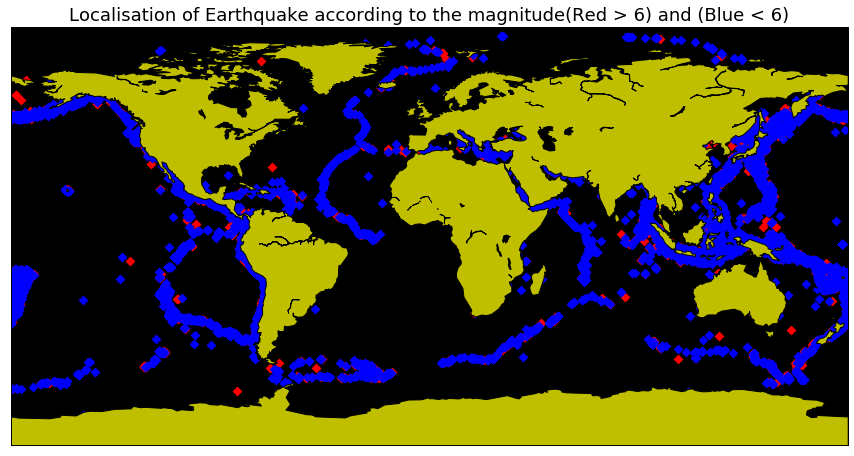

In [40]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

exp = new_data.loc[new_data['Type'] == 'Earthquake']
magnsup = exp.loc[exp['Magnitude'] >6]
magninf = exp.loc[exp['Magnitude'] < 6]

fig = plt.figure(figsize=(15,8))
plt.title('Localisation of Earthquake according to the magnitude(Red > 6) and (Blue < 6)', fontsize=18)
map = Basemap(projection='cyl',
lat_0=0, lon_0=0)
map.drawmapboundary(fill_color='black')
map.fillcontinents(color='y')
map.drawcoastlines()
lons = magnsup['Longitude'].tolist()
lats = magnsup['Latitude'].tolist()
x, y = map(lons, lats)
lons1 = magninf['Longitude'].tolist()
lats1 = magninf['Latitude'].tolist()
x1, y1 = map(lons1, lats1)
map.scatter(x, y, marker='D',color='r')
map.scatter(x1, y1, marker='D',color='b')
plt.show()


On this map built with Basemap, we locate in blue the earthquakes whose magnitude is less than 6. In red, the earthquakes whose magnitude is greater than 6. We note that the earthquakes are located on the coastlines of the different continents.



# Location of Nuclear Explosion with Basemap

C:\Users\kenny\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



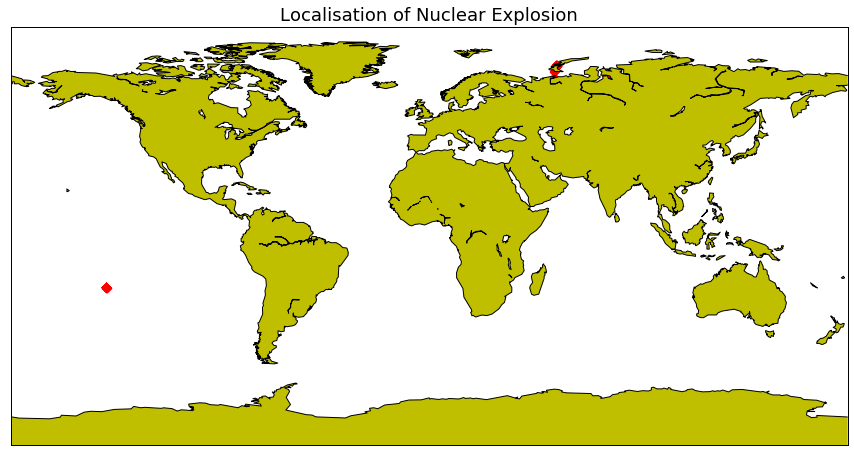

In [41]:

nuc = new_data.loc[new_data['Type'] == 'Nuclear Explosion']
fig = plt.figure(figsize=(15,8))
plt.title('Localisation of Nuclear Explosion', fontsize=18)
map = Basemap(projection='cyl',
lat_0=0, lon_0=0)
map.drawmapboundary(fill_color='w')
map.fillcontinents(color='y')
map.drawcoastlines()
lons = nuc['Longitude'].tolist()
lats = nuc['Latitude'].tolist()
x, y = map(lons, lats)
map.scatter(x, y, marker='D',color='r')
plt.show()


# Location of Rock Burst with Basemap

C:\Users\kenny\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: MatplotlibDeprecationWarning:


The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.



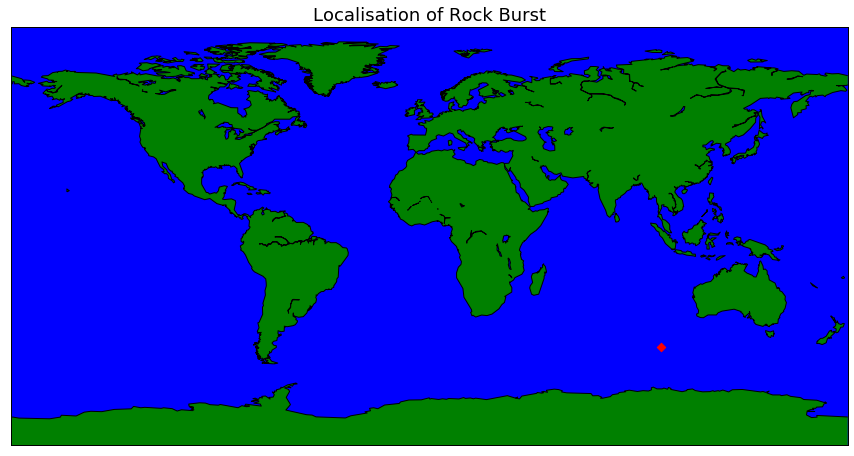

In [42]:
rock = new_data.loc[new_data['Type'] == 'Rock Burst']
fig = plt.figure(figsize=(15,8))
plt.title('Localisation of Rock Burst', fontsize=18)
map = Basemap(projection='cyl',
lat_0=0, lon_0=0)
map.drawmapboundary(fill_color='b')
map.fillcontinents(color='g')
map.drawcoastlines()
lons = rock['Longitude'].tolist()
lats = rock['Latitude'].tolist()
x, y = map(lons, lats)
map.scatter(x, y, marker='D',color='r')
plt.show()


# Map density and magnitude

In [43]:
import pandas as pd


import plotly.express as px
fig = px.density_mapbox(exp, lat='Latitude', lon='Longitude', z='Magnitude', radius=5,
                        center=dict(lat=0, lon=180), zoom=0,
                        mapbox_style="stamen-terrain")
fig.update_layout(title_text='Map density and magnitude')
fig.show()


# Magnitude Type ( Min - Max)

In [44]:
new_data['Magnitude'].groupby(new_data['Magnitude Type']).min()

Magnitude Type
MB     5.5
MD     5.6
MH     5.8
ML     5.5
MS     5.5
MW     5.5
MWB    5.5
MWC    5.5
MWR    5.5
MWW    5.5
Name: Magnitude, dtype: float64

In [45]:
#Magnitude Type: Source: https://www.usgs.gov/natural-hazards/earthquake-hazards/science/magnitude-types?qt-science_center_objects=0#qt-science_center_objects

# MB -> short-period body wave
# MD -> duration
# MH -> any
# ML -> local
# MS -> 20sec surface wave
# MW -> Moment W-phase
# MWB -> body wave
# MWC -> centroid
# MWR -> regional
# MWW -> Moment W-phase, generic notation Mw

In [46]:
new_data['Magnitude'].groupby(new_data['Magnitude Type']).max()

Magnitude Type
MB     6.9
MD     6.8
MH     7.2
ML     6.7
MS     8.0
MW     9.1
MWB    7.8
MWC    8.3
MWR    6.2
MWW    9.1
Name: Magnitude, dtype: float64

In [47]:
new_data['Magnitude Type'].unique().tolist()

['MW', 'ML', 'MH', 'MB', 'MS', 'MWC', 'MD', 'MWB', 'MWW', 'MWR']

# Only 1 earthquake recorded in France

In [48]:
new_data.loc[new_data['Pays_code3'] == "FRA"]

,Time,Latitude,Longitude,Type,Depth,Magnitude,Magnitude Type,Source,Year,Coutries,Pays_code,Pays_code3,Continents
Date,,,,,,,,,,,,,
1967-08-13,22:07:48,43.094,-0.731,Earthquake,10.0,5.7,MW,ISCGEM,1967,France,FR,FRA,Europe


# Average Depth according to the continents

In [49]:
new_data['Magnitude'].groupby(new_data['Continents']).mean()

Continents
Africa           5.833602
Asia             5.883261
Europe           5.884310
North America    5.905542
Oceania          5.883394
South America    5.871886
Name: Magnitude, dtype: float64

Text(0.5, 1.0, 'Average Depth according to the Continents')

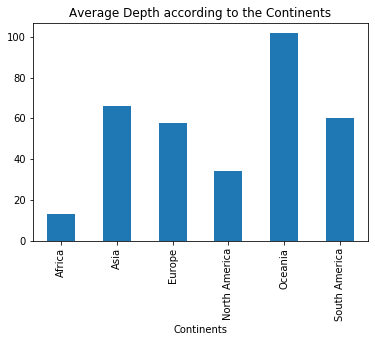

In [50]:
new_data['Depth'].groupby(new_data['Continents']).mean().plot.bar()
plt.title("Average Depth according to the Continents")

In [51]:
new_data['Continents'].groupby(new_data['Type']).value_counts()

Type               Continents   
Earthquake         Oceania          7448
                   Asia             7245
                   South America    2970
                   North America    2296
                   Europe           1935
                   Africa            372
Explosion          Oceania             2
                   Asia                1
                   Europe              1
Nuclear Explosion  Asia              108
                   Oceania            28
                   Europe             27
                   North America      12
Rock Burst         Oceania             1
Name: Continents, dtype: int64

# Sources and Magnitudes

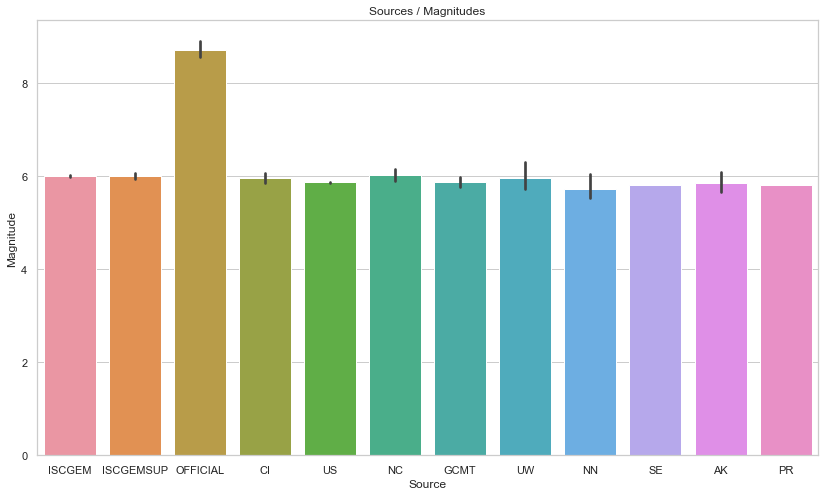

In [52]:
import seaborn as sns

sns.set(style="whitegrid")

tips = sns.load_dataset("tips")
plt.subplots(figsize = (14,8))
plt.title("Sources / Magnitudes")
ax = sns.barplot(x="Source", y="Magnitude", data=new_data)